# Tarefa 7a — Análise SelectKBest

Gráficos de barra do KBest a partir de múltiplos critérios de scoring estatístico via `sklearn.feature_selection.SelectKBest`.
Analisa os 3 datasets radiômicos: BW, Doppler e BW+Doppler, usando **todas as features** disponíveis.

**Critérios utilizados:**
- F-Score (ANOVA) — `f_classif`: mede a separabilidade linear entre classes por variância
- Informação Mútua — `mutual_info_classif`: captura dependências não-lineares entre feature e target

**Referências:**
- [SelectKBest](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectKBest.html)
- [f_classif](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.f_classif.html)
- [mutual_info_classif](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_classif.html)

## Env Configuration

Configuração do ambiente: caminhos, imports e parâmetros globais do experimento.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
from collections import Counter

PROJECT_ROOT = os.path.abspath(os.path.join(os.getcwd(), '..'))
DATA_DIR = os.path.join(PROJECT_ROOT, 'data', 'images', 'datasets')
OUTPUT_DIR = os.path.join(PROJECT_ROOT, 'notebooks')
MODULES_DIR = os.path.join(PROJECT_ROOT, 'modules')

if MODULES_DIR not in sys.path:
    sys.path.insert(0, MODULES_DIR)

from evaluation import plot_kbest_score_curves, META_COLS, DATASETS
from kbest_utils import run_kbest, shorten_name, build_criteria

SEED = 42

sns.set_theme(style='whitegrid', font_scale=1.0, rc={
    'figure.dpi': 130,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'grid.alpha': 0.3,
    'font.family': 'sans-serif',
})

PASTEL_COLORS = {
    'BW':         '#A3C4F3',
    'Doppler':    '#80CED7',
    'BW+Doppler': '#C3AED6',
}
ACCENT_COLORS = {
    'BW':         '#5B8DB8',
    'Doppler':    '#4A9EA6',
    'BW+Doppler': '#8B6FB0',
}
DS_COLORS = PASTEL_COLORS

CRIT_COLORS = {
    'F-Score (ANOVA)':    '#5B8DB8',
    'Mutual Information': '#8B6FB0',
}

print(f'Datasets: {list(DATASETS.keys())}')

## Functions

`run_kbest`, `shorten_name` e `build_criteria` vêm de `modules/kbest_utils.py`.
Cada critério recebe X (n_samples × n_features) e y (binário 0/1) e retorna os scores de todas as features, ordenados do maior para o menor.

In [ ]:
CRITERIA = build_criteria(SEED)

print('Critérios:', list[str](CRITERIA.keys()))

## Process

Pipeline de análise:
1. Carga dos datasets (apenas split `trainval`, fold ≥ 0)
2. Cálculo dos scores KBest via sklearn (`k='all'`) — ANOVA e Informação Mútua
3. Visualização dos top-20 por dataset × critério
4. Análise de consenso entre critérios
5. Mapa de sobreposição entre critérios
6. Exportação do ranking completo como CSV

### 1. Carga e descrição dos datasets

In [3]:
dfs = {}
for ds_name, ds_file in DATASETS.items():
    df = pd.read_csv(os.path.join(DATA_DIR, ds_file))
    dfs[ds_name] = df
    feat_cols = [c for c in df.columns if c not in META_COLS]
    trainval = df[df['split'] == 'trainval']
    test = df[df['split'] == 'test']
    print(f"=== {ds_name} ===")
    print(f"  Total amostras:  {len(df)}  |  trainval: {len(trainval)}  |  test: {len(test)}")
    print(f"  Features:        {len(feat_cols)}")
    print(f"  Distribuição (trainval): Benigno={int((trainval['target']==0).sum())}  Maligno={int((trainval['target']==1).sum())}")
    print(f"  Folds:           {sorted(trainval['split'].unique().tolist())}")
    print()

=== BW ===
  Total amostras:  198  |  trainval: 178  |  test: 20
  Features:        465
  Distribuição (trainval): Benigno=118  Maligno=60
  Folds:           ['trainval']

=== Doppler ===
  Total amostras:  198  |  trainval: 178  |  test: 20
  Features:        465
  Distribuição (trainval): Benigno=118  Maligno=60
  Folds:           ['trainval']



=== BW+Doppler ===
  Total amostras:  198  |  trainval: 178  |  test: 20
  Features:        930
  Distribuição (trainval): Benigno=118  Maligno=60
  Folds:           ['trainval']



### 2. Cálculo dos scores KBest

In [4]:
all_results = {}

for ds_name, df in dfs.items():
    feat_cols = [c for c in df.columns if c not in META_COLS]
    trainval = df[df['split'] == 'trainval']
    X = trainval[feat_cols].values.astype(float)
    y = trainval['target'].values

    all_results[ds_name] = {}
    for crit_name, fn in CRITERIA.items():
        print(f'  {ds_name} / {crit_name}...', end=' ', flush=True)
        scores = fn(X, y)
        idx_sorted = np.argsort(scores)[::-1]
        all_results[ds_name][crit_name] = {
            'full_names':  [feat_cols[i] for i in idx_sorted],
            'short_names': [shorten_name(feat_cols[i]) for i in idx_sorted],
            'scores':      scores[idx_sorted],
        }
        print(f'max={scores[idx_sorted[0]]:.4f} @ {shorten_name(feat_cols[idx_sorted[0]])}')

print('\nScores calculados.')

  BW / F-Score (ANOVA)... 

max=31.8649 @ wavelet-LH_glrlm_GrayLevelNonUniformityNormalized
  BW / Mutual Information... 

max=0.2101 @ wavelet-LH_gldm_LargeDependenceEmphasis
  Doppler / F-Score (ANOVA)... 

max=45.5219 @ wavelet-LL_gldm_DependenceEntropy
  Doppler / Mutual Information... 

max=0.1560 @ wavelet-LH_glrlm_GrayLevelNonUniformityNormalized
  BW+Doppler / F-Score (ANOVA)... 

max=45.5219 @ [D] wavelet-LL_gldm_DependenceEntropy
  BW+Doppler / Mutual Information... 

max=0.2101 @ [BW] wavelet-LH_gldm_LargeDependenceEmphasis

Scores calculados.


### 3. Gráficos de barra KBest — todas as features por dataset e critério

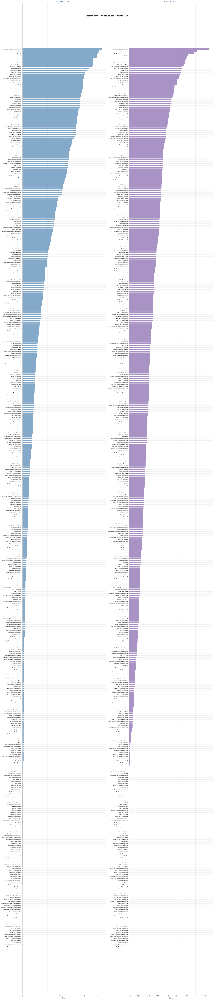

Salvo: /Users/lucasgambim/Documents/TCC-PROJECT/notebooks/task7a_kbest_all_BW.png


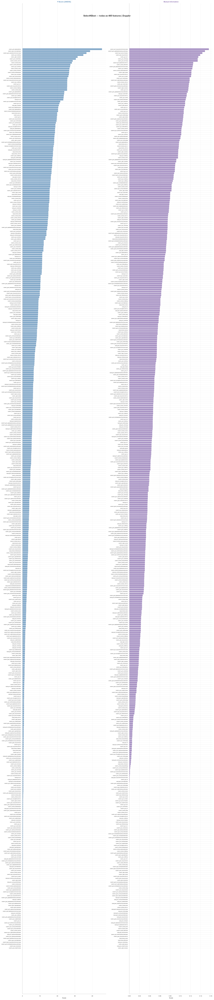

Salvo: /Users/lucasgambim/Documents/TCC-PROJECT/notebooks/task7a_kbest_all_Doppler.png


Salvo: /Users/lucasgambim/Documents/TCC-PROJECT/notebooks/task7a_kbest_all_BW_plus_Doppler.png


In [5]:
for ds_name in DATASETS.keys():
    n_feats = len(all_results[ds_name][list(CRITERIA.keys())[0]]['scores'])
    bar_height = 0.18
    fig_h = max(8, n_feats * bar_height)

    fig, axes = plt.subplots(1, len(CRITERIA), figsize=(18, fig_h))
    fig.suptitle(f'SelectKBest — todas as {n_feats} features | {ds_name}',
                 fontsize=13, fontweight='bold')

    for col_j, crit_name in enumerate(CRITERIA.keys()):
        ax = axes[col_j]
        res = all_results[ds_name][crit_name]

        names  = res['short_names'][::-1]
        values = res['scores'][::-1]

        color = CRIT_COLORS[crit_name]
        ax.barh(range(n_feats), values, color=color, alpha=0.75,
                edgecolor='none', height=0.85)
        ax.set_yticks(range(n_feats))
        ax.set_yticklabels(names, fontsize=4.5)
        ax.set_xlabel('Score', fontsize=9)
        ax.set_title(crit_name, fontsize=10, fontweight='bold', color=color)
        ax.tick_params(axis='x', labelsize=8)

    plt.tight_layout()
    safe_name = ds_name.replace('+', '_plus_')
    out_path = os.path.join(OUTPUT_DIR, f'task7a_kbest_all_{safe_name}.png')
    plt.savefig(out_path, dpi=120, bbox_inches='tight')
    plt.show()
    print(f'Salvo: {out_path}')

### 4. Análise de consenso — features eleitas por múltiplos critérios

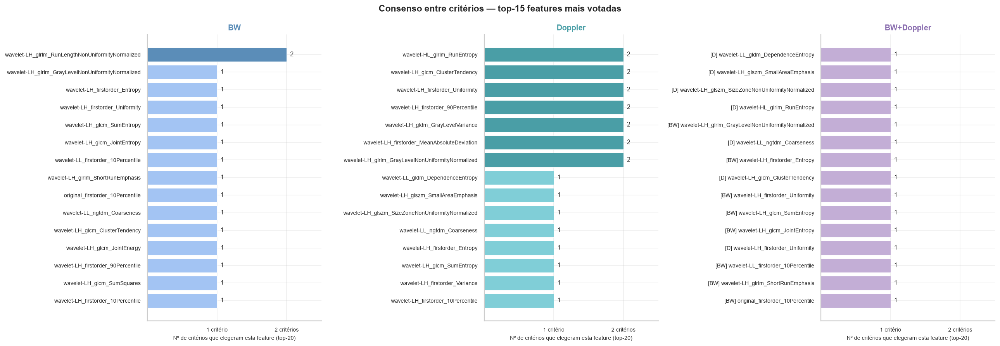

Salvo: /Users/lucasgambim/Documents/TCC-PROJECT/notebooks/task7a_kbest_consensus.png


In [6]:
TOP_CONSENSUS = 15

fig3, axes3 = plt.subplots(1, 3, figsize=(20, 7))
fig3.suptitle(f'Consenso entre critérios — top-{TOP_CONSENSUS} features mais votadas',
              fontsize=13, fontweight='bold')

for ax3, ds_name in zip(axes3, DATASETS.keys()):
    n_feats = len(all_results[ds_name][list(CRITERIA.keys())[0]]['scores'])
    TOP_K = min(20, n_feats)

    counter = Counter()
    for crit_name in CRITERIA.keys():
        counter.update(all_results[ds_name][crit_name]['full_names'][:TOP_K])

    top_consensus = counter.most_common(TOP_CONSENSUS)
    names  = [shorten_name(n) for n, _ in top_consensus][::-1]
    counts = [c for _, c in top_consensus][::-1]

    accent = ACCENT_COLORS[ds_name]
    pastel = PASTEL_COLORS[ds_name]
    colors_bar = [accent if c == len(CRITERIA) else pastel for c in counts]

    bars = ax3.barh(range(len(names)), counts, color=colors_bar, edgecolor='white', linewidth=0.5)
    ax3.set_yticks(range(len(names)))
    ax3.set_yticklabels(names, fontsize=8)
    ax3.set_xlabel('Nº de critérios que elegeram esta feature (top-20)', fontsize=8)
    ax3.set_title(f'{ds_name}', fontsize=11, fontweight='bold', color=accent)
    ax3.set_xlim(0, len(CRITERIA) + 0.5)
    ax3.set_xticks(range(1, len(CRITERIA) + 1))
    ax3.set_xticklabels([f'{i} critério{"s" if i > 1 else ""}' for i in range(1, len(CRITERIA) + 1)], fontsize=8)
    for bar, cnt in zip(bars, counts):
        ax3.text(bar.get_width() + 0.05, bar.get_y() + bar.get_height() / 2,
                 f'{cnt}', va='center', fontsize=9)

plt.tight_layout()
out_path = os.path.join(OUTPUT_DIR, 'task7a_kbest_consensus.png')
plt.savefig(out_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'Salvo: {out_path}')

### 5. Mapa de sobreposição entre critérios

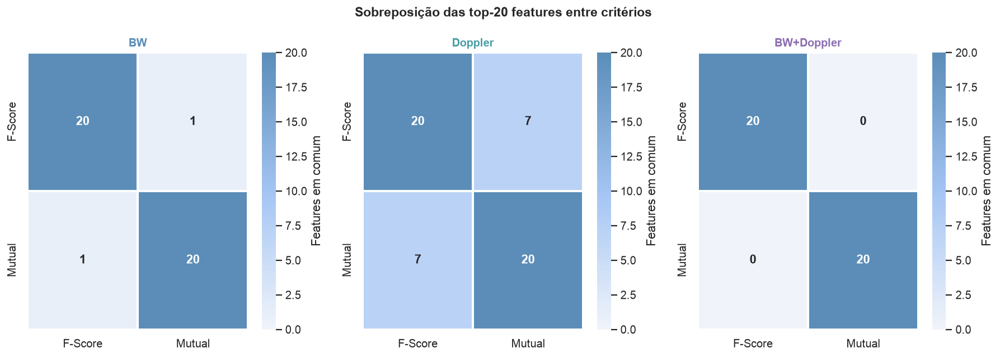

Salvo: /Users/lucasgambim/Documents/TCC-PROJECT/notebooks/task7a_kbest_overlap.png


In [7]:
from matplotlib.colors import LinearSegmentedColormap

pastel_cmap = LinearSegmentedColormap.from_list('pastel_blues',
    ['#F0F4FA', '#A3C4F3', '#5B8DB8'], N=256)

TOP_OVERLAP = 20
crit_short = [k.split(' ')[0] for k in CRITERIA.keys()]

fig2, axes2 = plt.subplots(1, 3, figsize=(14, 5))
fig2.suptitle(f'Sobreposição das top-{TOP_OVERLAP} features entre critérios',
              fontsize=13, fontweight='bold')

for ax2, ds_name in zip(axes2, DATASETS.keys()):
    accent = ACCENT_COLORS[ds_name]
    n_c = len(CRITERIA)
    overlap = np.zeros((n_c, n_c))
    for ki, ca in enumerate(CRITERIA.keys()):
        for kj, cb in enumerate(CRITERIA.keys()):
            set_a = set(all_results[ds_name][ca]['full_names'][:TOP_OVERLAP])
            set_b = set(all_results[ds_name][cb]['full_names'][:TOP_OVERLAP])
            overlap[ki, kj] = len(set_a & set_b)

    sns.heatmap(pd.DataFrame(overlap, index=crit_short, columns=crit_short),
                annot=True, fmt='.0f', cmap=pastel_cmap, vmin=0, vmax=TOP_OVERLAP,
                linewidths=2, linecolor='white', cbar_kws={'label': 'Features em comum'},
                annot_kws={'size': 12, 'fontweight': 'bold'}, ax=ax2)
    ax2.set_title(f'{ds_name}', fontsize=11, fontweight='bold', color=accent)

plt.tight_layout()
out_path = os.path.join(OUTPUT_DIR, 'task7a_kbest_overlap.png')
plt.savefig(out_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'Salvo: {out_path}')

### 6. Exportar ranking completo como CSV

In [8]:
rows = []
for ds_name in DATASETS.keys():
    for crit_name in CRITERIA.keys():
        res = all_results[ds_name][crit_name]
        for rank, (full_name, score) in enumerate(zip(res['full_names'], res['scores']), 1):
            rows.append({
                'dataset':       ds_name,
                'criterion':     crit_name,
                'rank':          rank,
                'feature':       full_name,
                'feature_short': shorten_name(full_name),
                'score':         score,
            })

df_rankings = pd.DataFrame(rows)
csv_out = os.path.join(OUTPUT_DIR, 'task7a_kbest_rankings.csv')
df_rankings.to_csv(csv_out, index=False)

print(f'Rankings salvo em: {csv_out}')
print(f'Total de entradas: {len(df_rankings)}')
display(df_rankings.head(10))

Rankings salvo em: /Users/lucasgambim/Documents/TCC-PROJECT/notebooks/task7a_kbest_rankings.csv
Total de entradas: 3720


,dataset,criterion,rank,feature,feature_short,score
0,BW,F-Score (ANOVA),1,wavelet-LH_glrlm_GrayLevelNonUniformityNormalized,wavelet-LH_glrlm_GrayLevelNonUniformityNormalized,31.864918
1,BW,F-Score (ANOVA),2,wavelet-LH_firstorder_Entropy,wavelet-LH_firstorder_Entropy,30.667761
2,BW,F-Score (ANOVA),3,wavelet-LH_firstorder_Uniformity,wavelet-LH_firstorder_Uniformity,30.397053
3,BW,F-Score (ANOVA),4,wavelet-LH_glcm_SumEntropy,wavelet-LH_glcm_SumEntropy,29.932238
4,BW,F-Score (ANOVA),5,wavelet-LH_glcm_JointEntropy,wavelet-LH_glcm_JointEntropy,29.771131
5,BW,F-Score (ANOVA),6,wavelet-LL_firstorder_10Percentile,wavelet-LL_firstorder_10Percentile,28.483831
6,BW,F-Score (ANOVA),7,wavelet-LH_glrlm_ShortRunEmphasis,wavelet-LH_glrlm_ShortRunEmphasis,28.374036
7,BW,F-Score (ANOVA),8,original_firstorder_10Percentile,original_firstorder_10Percentile,28.330873
8,BW,F-Score (ANOVA),9,wavelet-LL_ngtdm_Coarseness,wavelet-LL_ngtdm_Coarseness,28.124339
9,BW,F-Score (ANOVA),10,wavelet-LH_glcm_ClusterTendency,wavelet-LH_glcm_ClusterTendency,27.926709


### 7. Sumário — Features com consenso total (2/2 critérios) por dataset

In [10]:
TOP_K_CONSENSUS = 20  # top-K de cada critério usado para definir consenso

print(f'=== FEATURES COM CONSENSO TOTAL (2/2 CRITÉRIOS) — top-{TOP_K_CONSENSUS} de cada ===\n')
for ds_name in DATASETS.keys():
    counter = Counter()
    for crit_name in CRITERIA.keys():
        counter.update(all_results[ds_name][crit_name]['full_names'][:TOP_K_CONSENSUS])

    top_full = [n for n, c in counter.most_common() if c == len(CRITERIA)]
    print(f'--- {ds_name} ---')
    for i, feat in enumerate(top_full, 1):
        print(f'  {i:2d}. {feat}')
    print(f'  Total: {len(top_full)} features\n')

print('Nota: Estas features são candidatas primárias para a Trilha A (SelectKBest).')

=== FEATURES COM CONSENSO TOTAL (2/2 CRITÉRIOS) — top-20 de cada ===

--- BW ---
   1. wavelet-LH_glrlm_RunLengthNonUniformityNormalized
  Total: 1 features

--- Doppler ---
   1. wavelet-HL_glrlm_RunEntropy
   2. wavelet-LH_glcm_ClusterTendency
   3. wavelet-LH_firstorder_Uniformity
   4. wavelet-LH_firstorder_90Percentile
   5. wavelet-LH_gldm_GrayLevelVariance
   6. wavelet-LH_firstorder_MeanAbsoluteDeviation
   7. wavelet-LH_glrlm_GrayLevelNonUniformityNormalized
  Total: 7 features

--- BW+Doppler ---
  Total: 0 features

Nota: Estas features são candidatas primárias para a Trilha A (SelectKBest).


### 8. Curva de dispersão dos scores SelectKBest por dataset

Curva de dispersão (score vs. posição no ranking), uma linha por dataset
(BW, Doppler, BW+Doppler) e um painel por critério (ANOVA/MI). Mostra a
queda do score conforme a posição no ranking aumenta, permitindo comparar
a concentração de informação entre os datasets (`task7a_kbest_score_curves.png`).

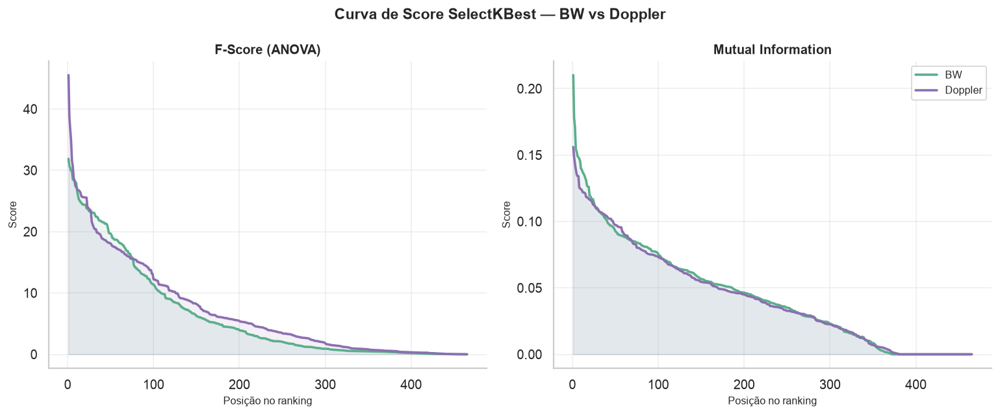

Salvo: /Users/lucasgambim/Documents/TCC-PROJECT/notebooks/task7a_kbest_score_curves.png


In [11]:
SCORE_COLORS = {'BW': '#5BAE8C', 'Doppler': '#8B6FB0'}

df_plot = df_rankings[df_rankings['dataset'] != 'BW+Doppler']
criteria = sorted(df_plot['criterion'].unique())

fig, axes = plt.subplots(1, len(criteria), figsize=(12, 5))
fig.suptitle('Curva de Score SelectKBest — BW vs Doppler',
             fontsize=13, fontweight='bold')

for ax, crit_name in zip(axes, criteria):
    for ds_name in ['BW', 'Doppler']:
        sub = df_plot[(df_plot['dataset'] == ds_name) &
                      (df_plot['criterion'] == crit_name)].sort_values('rank')
        color = SCORE_COLORS[ds_name]
        ax.plot(sub['rank'], sub['score'], color=color, lw=2, label=ds_name)
        ax.fill_between(sub['rank'], sub['score'], color=color, alpha=0.10)

    ax.set_xlabel('Posição no ranking', fontsize=9)
    ax.set_ylabel('Score', fontsize=9)
    ax.set_title(crit_name, fontsize=11, fontweight='bold')
    if crit_name == 'Mutual Information':
        ax.legend(fontsize=9)

plt.tight_layout()
out_path = os.path.join(OUTPUT_DIR, 'task7a_kbest_score_curves.png')
plt.savefig(out_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'Salvo: {out_path}')